<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Imports-and-Constants" data-toc-modified-id="Imports-and-Constants-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Imports and Constants</a></span></li><li><span><a href="#Load-Data" data-toc-modified-id="Load-Data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Load Data</a></span><ul class="toc-item"><li><span><a href="#Load-delta-pairs-DataFrame" data-toc-modified-id="Load-delta-pairs-DataFrame-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Load delta pairs DataFrame</a></span></li></ul></li><li><span><a href="#Labels-distribution" data-toc-modified-id="Labels-distribution-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Labels distribution</a></span><ul class="toc-item"><li><span><a href="#Delta-of-index" data-toc-modified-id="Delta-of-index-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Delta of index</a></span></li><li><span><a href="#Index-of-delta" data-toc-modified-id="Index-of-delta-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Index of delta</a></span></li></ul></li><li><span><a href="#Households-vs.-labels" data-toc-modified-id="Households-vs.-labels-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Households vs. labels</a></span></li><li><span><a href="#Index-of-delta-vs.-Delta-of-index" data-toc-modified-id="Index-of-delta-vs.-Delta-of-index-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Index-of-delta vs. Delta-of-index</a></span></li><li><span><a href="#Visualize-Images" data-toc-modified-id="Visualize-Images-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Visualize Images</a></span><ul class="toc-item"><li><span><a href="#Largest-positive-delta" data-toc-modified-id="Largest-positive-delta-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Largest positive delta</a></span></li><li><span><a href="#Largest-negative-delta" data-toc-modified-id="Largest-negative-delta-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Largest negative delta</a></span></li><li><span><a href="#Smallest-absolute-delta" data-toc-modified-id="Smallest-absolute-delta-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>Smallest absolute delta</a></span></li></ul></li></ul></div>

Prerequisites
1. Run the first couple of sections from `models/baselines_lsms.ipynb` to create `data/lsms_image_hists.npz`.

Required data file: `data/lsmsdelta_pairs.csv`

# Imports and Constants

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
import pickle
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf

sys.path.append('../')
from batchers import batcher, dataset_constants
from utils.analysis import evaluate_df
from utils.general import load_npz
from utils.plot import boxplot_df, plot_image_by_band

In [3]:
FOLDS = ['A', 'B', 'C', 'D', 'E']
BAND_ORDER = ['BLUE', 'GREEN', 'RED', 'SWIR1', 'SWIR2', 'TEMP1', 'NIR', 'NIGHTLIGHTS']

# Load Data

In [4]:
npz = load_npz('../data/lsms_image_hists.npz')
locs = npz['locs']
labels = npz['labels']
years = npz['years']

image_hists: dtype=int64, shape=(3020, 8, 102)
labels: dtype=float32, shape=(3020,)
locs: dtype=float32, shape=(3020, 2)
years: dtype=int32, shape=(3020,)
nls_center: dtype=float32, shape=(3020,)
nls_mean: dtype=float32, shape=(3020,)


## Load delta pairs DataFrame

In [5]:
df = pd.read_csv('../data/lsmsdelta_pairs.csv', index_col=False)
df.rename({
    'index': 'deltaofindex',
    'index_diff': 'indexofdelta',
    'x': 'households'
}, axis=1, inplace=True)

uganda_mask = df['country'] == 'uganda'

with pd.option_context('display.max_rows', 6):
    display(df)

,lat,lon,year.x,country,year.y,deltaofindex,indexofdelta,geolev1,geolev2,households,tfrecords_index.x,tfrecords_index.y
0,-0.292248,31.478722,2005,uganda,2009,-0.369128,-1.782208,UGA.53,UGA,8,2574,2694
1,-0.292248,31.478722,2009,uganda,2013,-0.047140,-0.119516,UGA.53,UGA,8,2694,2941
2,-0.439120,31.711950,2005,uganda,2009,-0.211227,-2.585721,UGA.35,UGA,1,2573,2693
...,...,...,...,...,...,...,...,...,...,...,...,...
1536,9.912650,42.472549,2011,ethiopia,2015,0.135052,0.456427,ETH.9,ETH,7,8,337
1537,9.917938,11.689417,2010,nigeria,2015,0.700611,0.777255,NGA.16,NGA,1,1145,1626
1538,9.991906,37.692553,2011,ethiopia,2015,0.072652,0.049075,ETH.3,ETH,9,120,449


In [6]:
with open('../data/lsms_incountry_folds.pkl', 'rb') as f:
    incountry_folds = pickle.load(f)

country_labels = df['country'].map(dataset_constants.LSMS_COUNTRIES.index).values
country_indices = {
    country: np.flatnonzero(df['country'] == country)
    for country in dataset_constants.LSMS_COUNTRIES
}
households = df['households'].values

npairs = len(df)
incountry_group_labels = np.zeros(npairs, dtype=np.int32)
for i, f in enumerate(FOLDS):
    fold_mask = df[['tfrecords_index.x', 'tfrecords_index.y']].isin(incountry_folds[f]['test']).values
    assert np.all(fold_mask[:, 0] == fold_mask[:, 1])
    fold_mask = fold_mask[:, 0]
    incountry_group_labels[fold_mask] = i

# Labels distribution

In [7]:
def describe_deltas(df, label_col):
    '''
    Args
    - df: pd.DataFrame, columns ['country', 'year.x', 'year.y', label_col]
    - label_col: str, name of label column
    '''
    describe_df = df.groupby(['country', 'year.x', 'year.y'])[label_col].describe()
    describe_df.loc[('overall', 'before', 'after')] = df[label_col].describe()
    display(describe_df)

def signs(df, label_col):
    '''
    Args
    - df: pd.DataFrame, columns ['country', 'year.x', 'year.y', label_col]
    - label_col: str, name of label column
    '''
    # signs_df: pd.DataFrame, index ['country', 'year.x', 'year.y'], columns [-1, 0, 1]
    df['sign'] = np.sign(df[label_col]).astype(np.int32)
    signs_df = df.groupby(['country', 'year.x', 'year.y', 'sign']).size().unstack('sign')
    signs_df.loc[('overall', 'before', 'after')] = df.groupby('sign').size()
    df.drop('sign', axis=1, inplace=True)
    signs_df.fillna(0, inplace=True)
    signs_df = signs_df.astype(np.int32)
    display(signs_df)

    ax = signs_df.div(signs_df.sum(axis=1), axis=0)[[-1, 1]].plot(kind='barh', grid=True, width=0.8)
    ax.set_xlabel('fraction')
    ax.set_title(f'Fraction of locs with increasing {label_col}')
    ax.invert_yaxis()
    plt.show()

def hist_labels(df, label_col, bins):
    '''
    Args
    - df: pd.DataFrame, columns ['country', 'year.x', 'year.y', label_col]
    - label_col: str, name of label column
    '''
    fig, ax = plt.subplots(1, 1, figsize=(2.7, 2.7))
    df[label_col].plot.hist(ax=ax, bins=bins, grid=True)
    ax.set(title='overall', xlabel=label_col)
    fig.tight_layout()

    fig, axs = plt.subplots(1, 6, sharey=True, figsize=(13, 2.7))
    for i, (key, group_df) in enumerate(df.groupby(['country', 'year.x', 'year.y'])):
        ax = axs[i]
        ax.set(title=key, xlabel=label_col)
        group_df[label_col].plot.hist(ax=ax, bins=bins, grid=True)
    fig.tight_layout()
    plt.show()

In [8]:
display(df[['deltaofindex', 'indexofdelta']].agg(['min', 'max']))
doi_bins = np.arange(-1.70, 2.11, 0.1)
iod_bins = np.arange(-3.00, 3.46, 0.1)

,deltaofindex,indexofdelta
min,-1.654822,-2.966687
max,2.053319,3.411730


## Delta of index

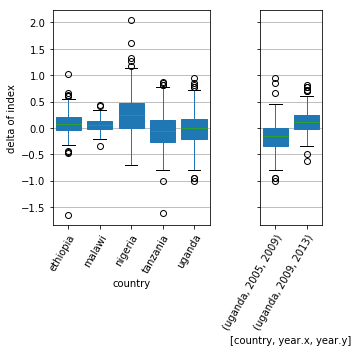

In [9]:
fig, axs = plt.subplots(1, 2, sharey=True, figsize=(5, 5),
                        gridspec_kw={'width_ratios': [5, 2]})
boxplot_df(df, y='deltaofindex', by='country',
           ylabel='delta of index', ax=axs[0])
boxplot_df(df.loc[uganda_mask], y='deltaofindex',
           by=['country', 'year.x', 'year.y'], ax=axs[1])
fig.tight_layout()
plt.show()

deltaofindex


count      mean       std       min       25%  \
country  year.x year.y                                                   
ethiopia 2011   2015     327.0  0.087115  0.232093 -1.654822 -0.042371   
malawi   2010   2016     102.0  0.054087  0.143315 -0.336216 -0.029296   
nigeria  2010   2015     480.0  0.250946  0.366662 -0.702761 -0.004727   
tanzania 2008   2012     300.0 -0.059058  0.344583 -1.610586 -0.269446   
uganda   2005   2009     165.0 -0.167106  0.311735 -0.999489 -0.352306   
         2009   2013     165.0  0.127208  0.236492 -0.636305 -0.019490   
overall  before after   1539.0  0.084573  0.337288 -1.654822 -0.116122   

                             50%       75%       max  
country  year.x year.y                                
ethiopia 2011   2015    0.067743  0.209459  1.031208  
malawi   2010   2016    0.050049  0.136057  0.435801  
nigeria  2010   2015    0.234892  0.463617  2.053319  
tanzania 2008   2012   -0.056637  0.154805  0.861227  
uganda   2005   2009   -0.157111  0.002570  0.947168  
         2009   2013    0.113286  0.253182  0.816607  
overall  before after   0.059998  0.275159  2.053319

sign                     -1   0    1
country  year.x year.y              
ethiopia 2011   2015    101   1  225
malawi   2010   2016     37   0   65
nigeria  2010   2015    123   0  357
tanzania 2008   2012    175   1  124
uganda   2005   2009    122   1   42
         2009   2013     45   2  118
overall  before after   603   5  931

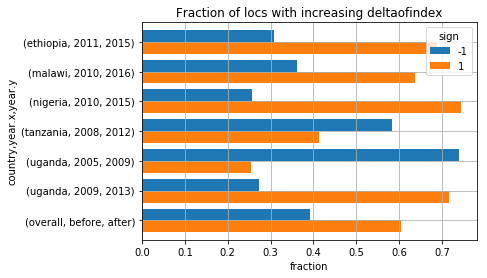

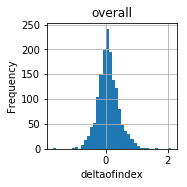

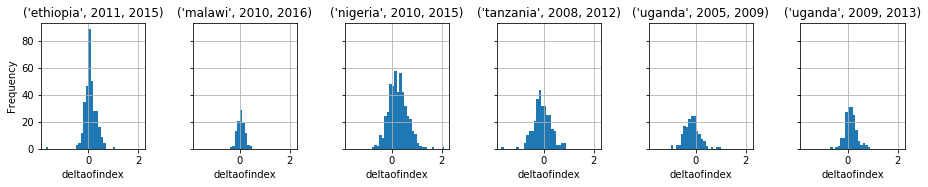

In [10]:
label_col = 'deltaofindex'
print(label_col)
describe_deltas(df, label_col)
signs(df, label_col)
hist_labels(df, label_col, bins=doi_bins)

In [11]:
# forward direction only
deltas = np.sort(df[label_col])
print('min:', deltas[0])
print('1/3:', deltas[int(1/3 * len(deltas))])
print('2/3:', deltas[int(2/3 * len(deltas))])
print('max:', deltas[-1])

# using -0.1 and 0.1 as cut-offs
print('class (-):', np.sum(deltas < -0.1) / len(deltas))
print('class (0):', np.sum((deltas >= -0.1) & (deltas <= 0.1)) / len(deltas))
print('class (+):', np.sum(deltas > 0.1) / len(deltas))

min: -1.6548216650855498
1/3: -0.033722392880693
2/3: 0.19045040717262196
max: 2.05331941944801
class (-): 0.26575698505523065
class (0): 0.285899935022742
class (+): 0.44834307992202727


## Index of delta

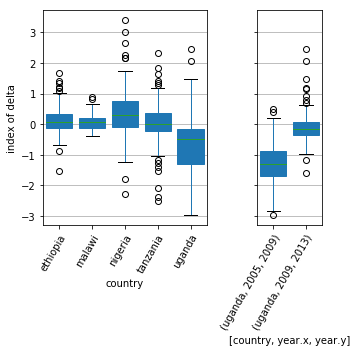

In [12]:
fig, axs = plt.subplots(1, 2, sharey=True, figsize=(5, 5),
                        gridspec_kw={'width_ratios': [5, 2]})
boxplot_df(df, y='indexofdelta', by='country',
           ylabel='index of delta', ax=axs[0])
boxplot_df(df.loc[uganda_mask], y='indexofdelta',
           by=['country', 'year.x', 'year.y'], ax=axs[1])
fig.tight_layout()
plt.show()

indexofdelta


count      mean       std       min       25%  \
country  year.x year.y                                                   
ethiopia 2011   2015     327.0  0.141092  0.392683 -1.513083 -0.114108   
malawi   2010   2016     102.0  0.088393  0.255975 -0.378885 -0.111437   
nigeria  2010   2015     480.0  0.333131  0.656620 -2.280382 -0.085536   
tanzania 2008   2012     300.0  0.053663  0.558760 -2.506919 -0.227220   
uganda   2005   2009     165.0 -1.279659  0.668458 -2.966687 -1.707060   
         2009   2013     165.0 -0.108855  0.481910 -1.579814 -0.343778   
overall  before after   1539.0  0.001332  0.721989 -2.966687 -0.286792   

                             50%       75%       max  
country  year.x year.y                                
ethiopia 2011   2015    0.060686  0.340860  1.680708  
malawi   2010   2016    0.061035  0.207420  0.878061  
nigeria  2010   2015    0.290323  0.767942  3.411730  
tanzania 2008   2012    0.013041  0.360675  2.328947  
uganda   2005   2009   -1.305578 -0.890411  0.486462  
         2009   2013   -0.172420  0.072036  2.467228  
overall  before after   0.018060  0.403002  3.411730

sign                     -1    1
country  year.x year.y          
ethiopia 2011   2015    140  187
malawi   2010   2016     40   62
nigeria  2010   2015    140  340
tanzania 2008   2012    144  156
uganda   2005   2009    159    6
         2009   2013    117   48
overall  before after   740  799

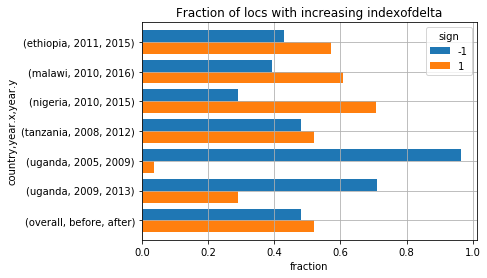

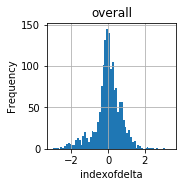

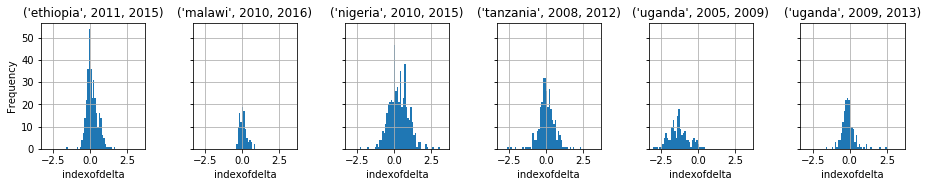

In [13]:
label_col = 'indexofdelta'
print(label_col)
describe_deltas(df, label_col)
signs(df, label_col)
hist_labels(df, label_col, bins=iod_bins)

In [14]:
# forward direction only
deltas = np.sort(df[label_col])
print('min:', deltas[0])
print('1/3:', deltas[int(1/3 * len(deltas))])
print('2/3:', deltas[int(2/3 * len(deltas))])
print('max:', deltas[-1])

# using -0.2 and 0.2 as cut-offs
print('class (-):', np.sum(deltas < -0.2) / len(deltas))
print('class (0):', np.sum((deltas >= -0.2) & (deltas <= 0.2)) / len(deltas))
print('class (+):', np.sum(deltas > 0.2) / len(deltas))

min: -2.96668737687702
1/3: -0.164167737571375
2/3: 0.249766946484311
max: 3.4117300303649
class (-): 0.30084470435347627
class (0): 0.3333333333333333
class (+): 0.36582196231319036


# Households vs. labels

In [15]:
print('Number of households')
display(
    df
    .groupby(['country', 'year.x', 'year.y'])['households']
    .agg(['sum', 'mean', 'median', 'size']))

Number of households


sum       mean  median  size
country  year.x year.y                               
ethiopia 2011   2015    2719   8.314985       9   327
malawi   2010   2016    1424  13.960784      15   102
nigeria  2010   2015    2837   5.910417       6   480
tanzania 2008   2012     848   2.826667       3   300
uganda   2005   2009     928   5.624242       6   165
         2009   2013     932   5.648485       6   165

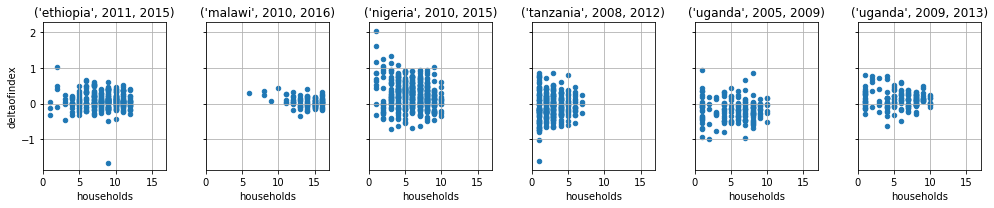

In [16]:
fig, axs = plt.subplots(1, 6, sharey=True, figsize=(14, 3))
for i, (country, group) in enumerate(df.groupby(['country', 'year.x', 'year.y'])):
    ax = axs[i]
    ax.set_xlim(households.min() - 1, households.max() + 1)
    ax.set_title(country)
    group.plot.scatter(x='households', y='deltaofindex', ax=ax, grid=True)
fig.tight_layout()

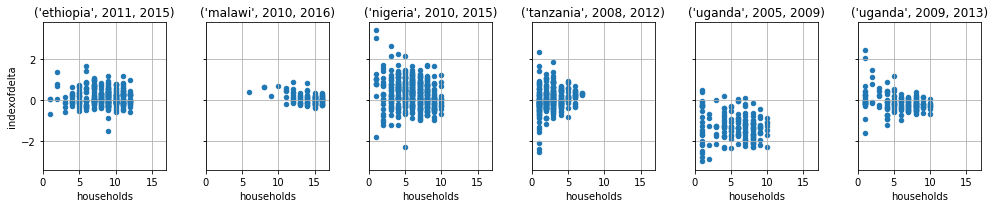

In [17]:
fig, axs = plt.subplots(1, 6, sharey=True, figsize=(14, 3))
for i, (country, group) in enumerate(df.groupby(['country', 'year.x', 'year.y'])):
    ax = axs[i]
    ax.set_xlim(households.min() - 1, households.max() + 1)
    ax.set_title(country)
    group.plot.scatter(x='households', y='indexofdelta', ax=ax, grid=True)
fig.tight_layout()

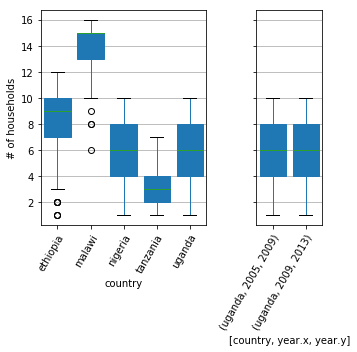

In [18]:
fig, axs = plt.subplots(1, 2, sharey=True, figsize=(5, 5),
                        gridspec_kw={'width_ratios': [5, 2]})
boxplot_df(df, y='households', by='country',
           ylabel='# of households', ax=axs[0])
boxplot_df(df.loc[uganda_mask], y='households',
           by=['country', 'year.x', 'year.y'], ax=axs[1])
fig.tight_layout()
plt.show()

# Index-of-delta vs. Delta-of-index

In [19]:
display(evaluate_df(df, cols=['indexofdelta'], labels_col='deltaofindex', weights_col='households'))
display(
    df.groupby('country')
    .apply(evaluate_df, cols=['indexofdelta'], labels_col='deltaofindex', weights_col='households'))
display(
    df.loc[uganda_mask].groupby(['country', 'year.x', 'year.y'])
    .apply(evaluate_df, cols=['indexofdelta'], labels_col='deltaofindex', weights_col='households'))

,r2,R2,mse,rank
indexofdelta,0.512428,-1.905201,0.242289,0.695726


,,r2,R2,mse,rank
country,,,,,
ethiopia,indexofdelta,0.648839,-0.204915,0.059974,0.791281
malawi,indexofdelta,0.609685,-0.374799,0.026230,0.780550
nigeria,indexofdelta,0.611954,-0.467480,0.164670,0.763631
tanzania,indexofdelta,0.426710,-0.621012,0.151624,0.645409
uganda,indexofdelta,0.544693,-9.186928,0.833939,0.687767


r2         R2       mse      rank
country year.x year.y                                                      
uganda  2005   2009   indexofdelta  0.517343 -17.602089  1.485731  0.670499
        2009   2013   indexofdelta  0.221814  -3.270867  0.184945  0.396260

In [20]:
display(evaluate_df(df, cols=['indexofdelta'], labels_col='deltaofindex', weights_col=None))
display(
    df.groupby('country')
    .apply(evaluate_df, cols=['indexofdelta'], labels_col='deltaofindex', weights_col=None))
display(
    df.loc[uganda_mask].groupby(['country', 'year.x', 'year.y'])
    .apply(evaluate_df, cols=['indexofdelta'], labels_col='deltaofindex', weights_col=None))

,r2,R2,mse,rank
indexofdelta,0.488992,-1.649274,0.301194,0.695726


,,r2,R2,mse,rank
country,,,,,
ethiopia,indexofdelta,0.632643,-0.225375,0.065806,0.791281
malawi,indexofdelta,0.634533,-0.402497,0.028524,0.780550
nigeria,indexofdelta,0.586949,-0.513367,0.203034,0.763631
tanzania,indexofdelta,0.440451,-0.584469,0.187509,0.645409
uganda,indexofdelta,0.508571,-7.848074,0.864852,0.687767


r2         R2       mse      rank
country year.x year.y                                                      
uganda  2005   2009   indexofdelta  0.425072 -14.616789  1.508420  0.670499
        2009   2013   indexofdelta  0.284595  -2.980678  0.221284  0.396260

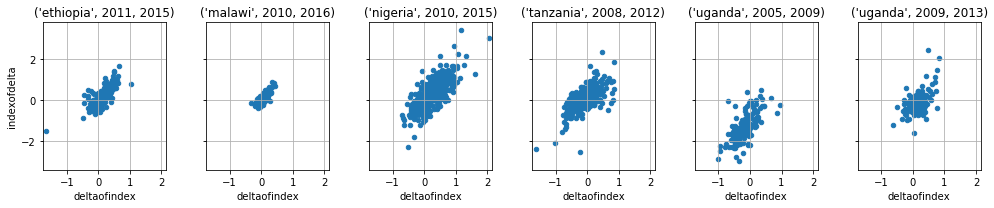

In [21]:
fig, axs = plt.subplots(1, 6, sharey=True, figsize=(14, 3))
min_deltaofindex = df['deltaofindex'].min()
max_deltaofindex = df['deltaofindex'].max()
for i, (country, group) in enumerate(df.groupby(['country', 'year.x', 'year.y'])):
    ax = axs[i]
    ax.set_xlim(min_deltaofindex - 0.1, max_deltaofindex + 0.1)
    ax.set_title(country)
    group.plot.scatter(x='deltaofindex', y='indexofdelta', ax=ax, grid=True)
fig.tight_layout()

# Visualize Images

In [22]:
tfrecord_paths = np.asarray(batcher.get_lsms_tfrecord_paths(dataset_constants.SURVEY_NAMES['LSMS']))
K = 5

In [23]:
def get_images(tfrecord_paths):
    '''
    Args
    - tfrecord_paths: list of str, length N <= 32, paths of TFRecord files

    Returns: np.array, shape [N, 224, 224, 8], type float32
    '''
    lsms_batcher = batcher.Batcher(
        tfrecord_files=tfrecord_paths,
        dataset='LSMS',
        batch_size=32,
        ls_bands='ms',
        nl_band='merge',
        label_name='wealthpooled',
        shuffle=False,
        augment=False,
        negatives='zero',
        normalize=True)
    init_iter, batch_op = lsms_batcher.get_batch()
    with tf.Session() as sess:
        sess.run(init_iter)
        images = sess.run(batch_op['images'])
    return images

In [24]:
def plot_images_by_delta(images1, images2, order, ranks_doi, ranks_iod, df):
    '''
    Args
    - images1, images2: np.array, shape [K, 224, 224, 8]
    - order: str, one of ['highest', 'lowest']
    - ranks_doi: np.array, shape [K]
    - ranks_iod: np.array, shape [K]
    - df: pd.DataFrame, rows sorted by 'index_of_delta' by the given order
        - columns: 'index_of_delta', 'year1', 'year2', 'lat', 'lon', 'country'
    '''
    cols = ['indexofdelta', 'deltaofindex', 'lat', 'lon', 'year.x', 'year.y', 'households', 'country']
    for k in range(len(images1)):
        iod, doi, lat, lon, y1, y2, h, country = df.iloc[k][cols]

        rank_doi = ranks_doi[k] + 1
        rank_iod = ranks_iod[k] + 1

        print(f'{rank_doi}-th {order} delta-of-index, {rank_iod}-th index-of-delta')
        print(f'({y1} - {y2}) delta-of-index={doi:.06f}, index-of-delta={iod:.06f}')
        print(f'loc = {country} ({lat:.06f}, {lon:.06f}), {h:d} households')
        for img, y in [(images1[k], y1), (images2[k], y2)]:
            band_order = list(BAND_ORDER)  # make a copy
            band_order[-1] = 'DMSP' if y < 2012 else 'VIIRS'
            plot_image_by_band(img, band_order, nrows=1, title=None, rgb='merge')

In [25]:
def match_best(sorted_idxs1, sorted_idxs2, K):
    '''
    Args
    - sorted_idxs1: np.array of indices
    - sorted_idxs1: np.array of indices
    - K: int

    Returns
    - all_best: np.array, indices of top-K from each of sorted_idxs
    - rank1: np.array, ranking of indices in all_largest by sorted_indxs1
    - rank2: np.array, ranking of indices in all_largest by sorted_indxs2
    '''
    k_best1 = sorted_idxs1[:K]
    k_best2 = sorted_idxs2[:K]

    all_best = list(k_best1)
    for idx in k_best2:
        if idx not in k_best1:
            all_best.append(idx)
    all_best = np.asarray(all_best)

    rank1 = np.where(sorted_idxs1 == all_best.reshape(-1, 1))[1]
    rank2 = np.where(sorted_idxs2 == all_best.reshape(-1, 1))[1]
    return all_best, rank1, rank2

In [26]:
sorted_iod_indices_smallest = np.argsort(df['indexofdelta'].values)
sorted_doi_indices_smallest = np.argsort(df['deltaofindex'].values)
sorted_iod_indices_largest = sorted_iod_indices_smallest[::-1]
sorted_doi_indices_largest = sorted_doi_indices_smallest[::-1]
sorted_abs_iod_indices = np.argsort(df['indexofdelta'].abs().values)
sorted_abs_doi_indices = np.argsort(df['deltaofindex'].abs().values)

## Largest positive delta

Instructions for updating:
Colocations handled automatically by placer.
1-th largest (+) delta-of-index, 2-th index-of-delta
(2010 - 2015) delta-of-index=2.053319, index-of-delta=3.015146
loc = nigeria (5.771212, 7.776873), 1 households


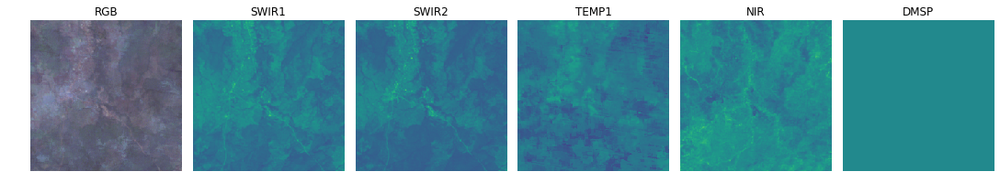

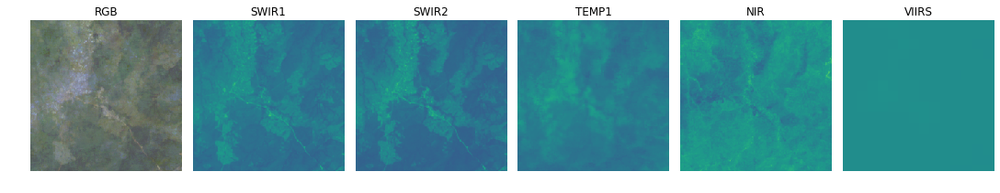

2-th largest (+) delta-of-index, 41-th index-of-delta
(2010 - 2015) delta-of-index=1.614787, index-of-delta=1.292954
loc = nigeria (11.499152, 10.071319), 1 households


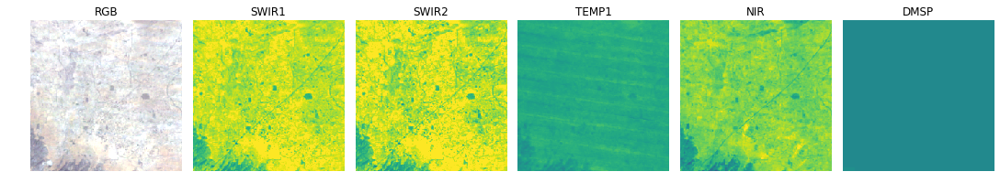

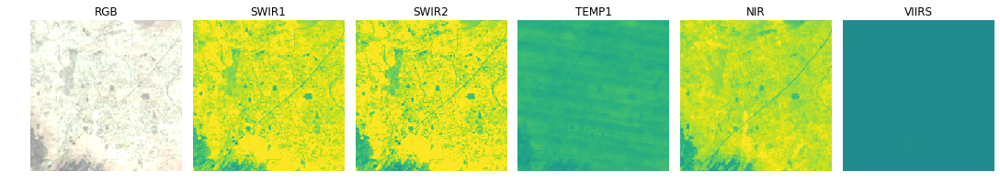

3-th largest (+) delta-of-index, 8-th index-of-delta
(2010 - 2015) delta-of-index=1.328947, index-of-delta=2.165907
loc = nigeria (6.716282, 8.947615), 3 households


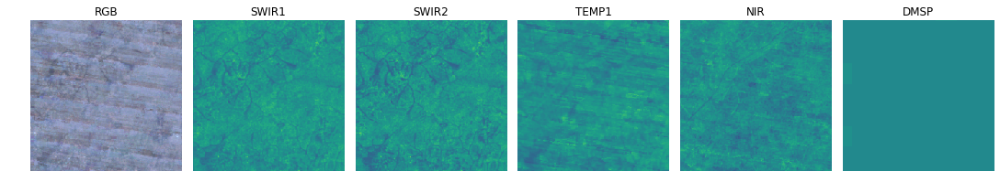

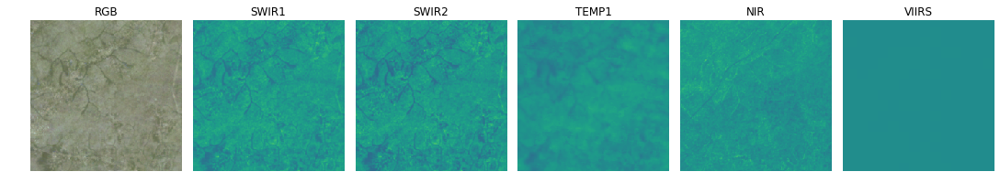

4-th largest (+) delta-of-index, 13-th index-of-delta
(2010 - 2015) delta-of-index=1.263402, index-of-delta=1.702163
loc = nigeria (9.456363, 7.404969), 2 households


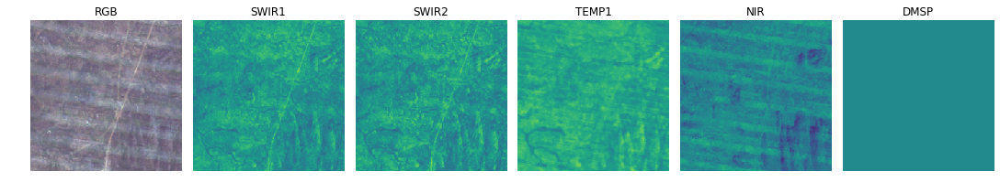

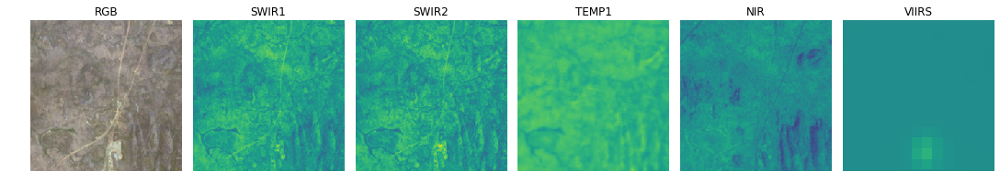

5-th largest (+) delta-of-index, 1-th index-of-delta
(2010 - 2015) delta-of-index=1.183210, index-of-delta=3.411730
loc = nigeria (7.310150, 9.822583), 1 households


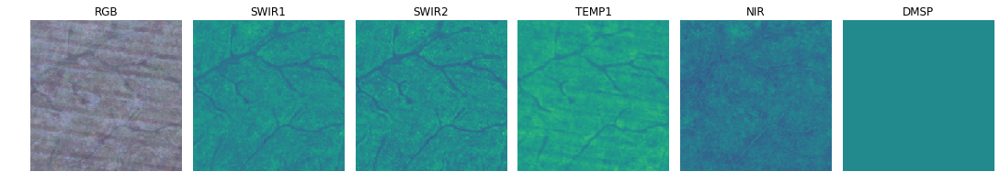

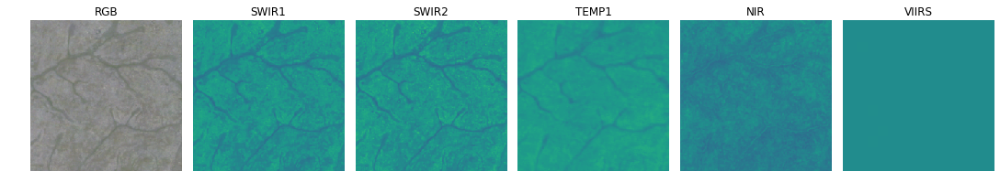

16-th largest (+) delta-of-index, 3-th index-of-delta
(2010 - 2015) delta-of-index=0.937909, index-of-delta=2.652482
loc = nigeria (8.654959, 2.969085), 3 households


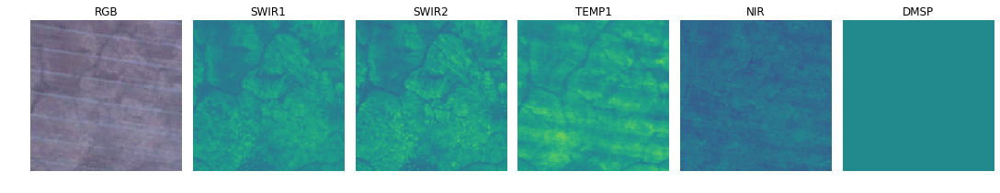

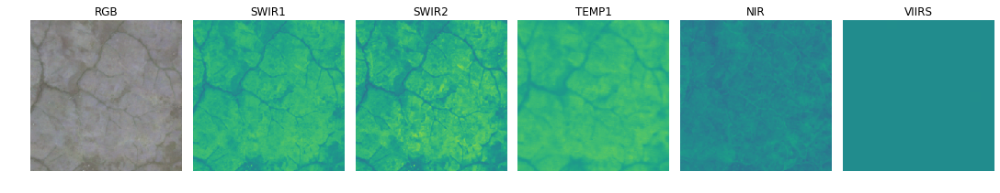

157-th largest (+) delta-of-index, 4-th index-of-delta
(2009 - 2013) delta-of-index=0.494485, index-of-delta=2.467228
loc = uganda (-0.903627, 31.765472), 1 households


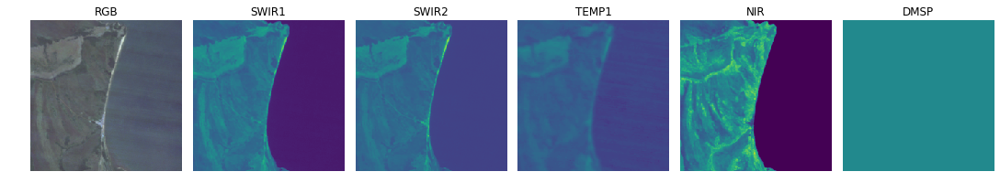

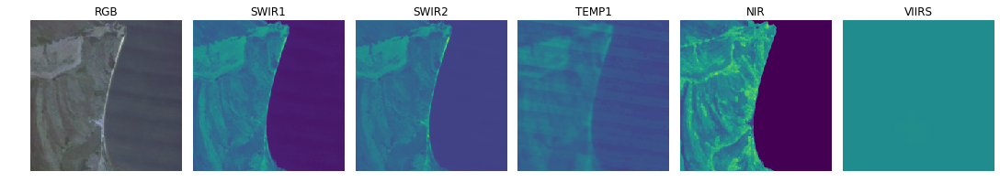

165-th largest (+) delta-of-index, 5-th index-of-delta
(2008 - 2012) delta-of-index=0.480444, index-of-delta=2.328947
loc = tanzania (-6.794890, 39.217499), 1 households


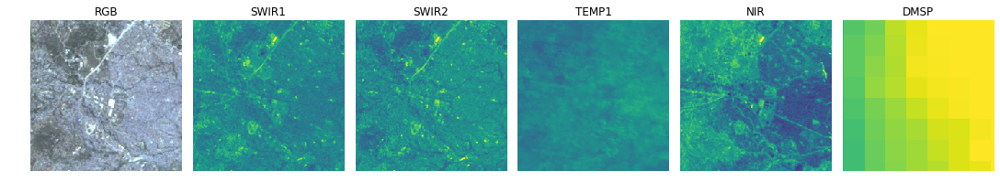

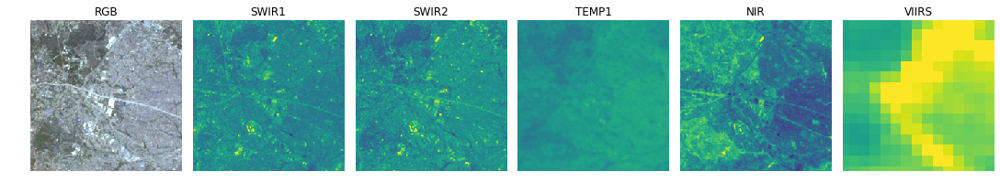

In [27]:
all_best, ranks_doi, ranks_iod = match_best(
    sorted_doi_indices_largest, sorted_iod_indices_largest, K=K)

paired_indices = df.loc[all_best, ['tfrecords_index.x', 'tfrecords_index.y']].values
images1 = get_images(tfrecord_paths[paired_indices[:, 0]])
images2 = get_images(tfrecord_paths[paired_indices[:, 1]])

plot_images_by_delta(
    images1, images2,
    order='largest (+)', ranks_doi=ranks_doi, ranks_iod=ranks_iod,
    df=df.loc[all_best])

## Largest negative delta

1-th largest (-) delta-of-index, 71-th index-of-delta
(2011 - 2015) delta-of-index=-1.654822, index-of-delta=-1.513083
loc = ethiopia (6.630950, 36.785203), 9 households


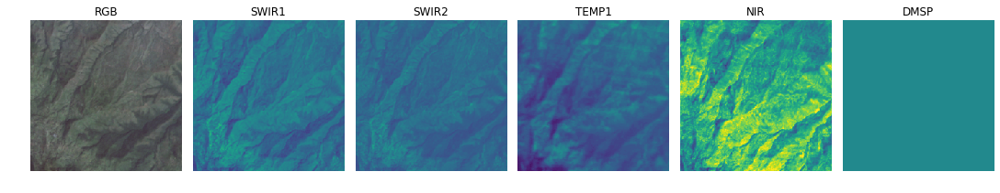

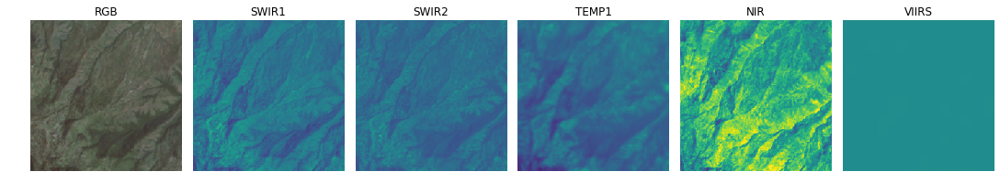

2-th largest (-) delta-of-index, 7-th index-of-delta
(2008 - 2012) delta-of-index=-1.610586, index-of-delta=-2.390227
loc = tanzania (-10.920880, 39.292690), 1 households


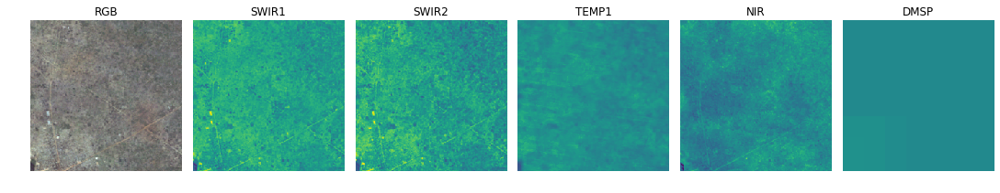

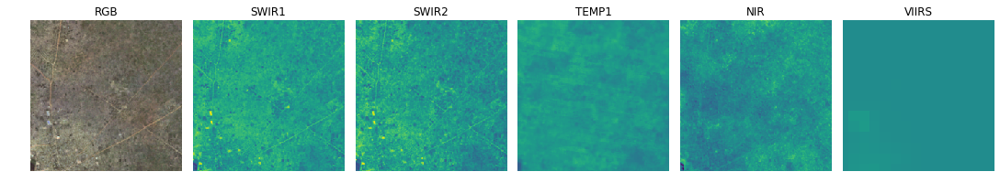

3-th largest (-) delta-of-index, 24-th index-of-delta
(2008 - 2012) delta-of-index=-1.017604, index-of-delta=-2.092729
loc = tanzania (-6.161320, 39.198002), 1 households


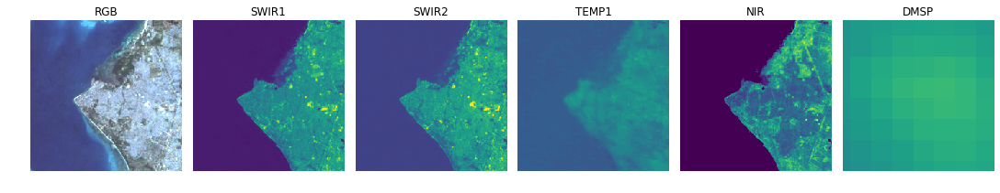

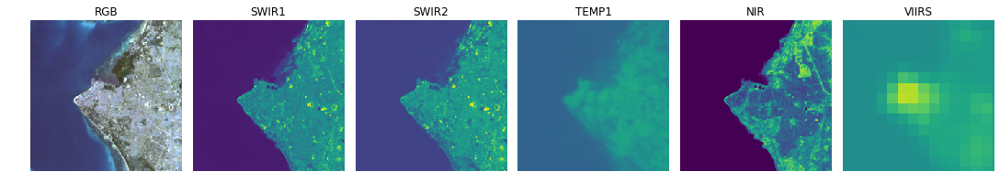

4-th largest (-) delta-of-index, 2-th index-of-delta
(2005 - 2009) delta-of-index=-0.999489, index-of-delta=-2.841265
loc = uganda (0.317143, 32.537323), 2 households


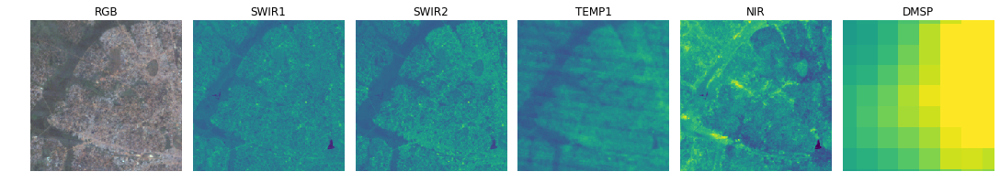

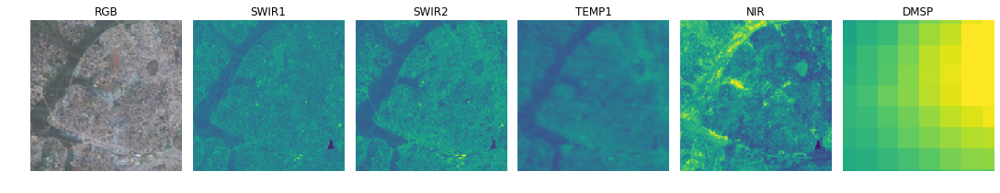

5-th largest (-) delta-of-index, 15-th index-of-delta
(2005 - 2009) delta-of-index=-0.954893, index-of-delta=-2.241798
loc = uganda (2.769515, 32.295139), 7 households


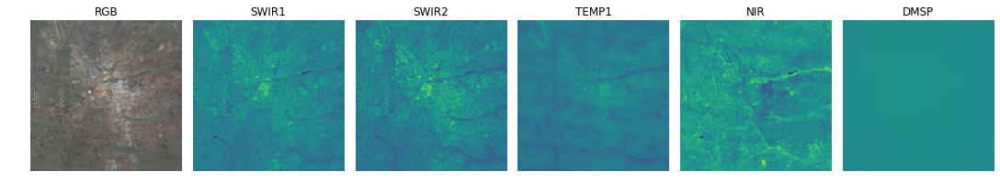

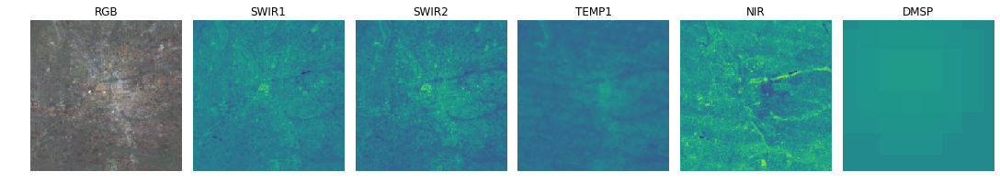

134-th largest (-) delta-of-index, 1-th index-of-delta
(2005 - 2009) delta-of-index=-0.333498, index-of-delta=-2.966687
loc = uganda (1.677468, 32.370129), 1 households


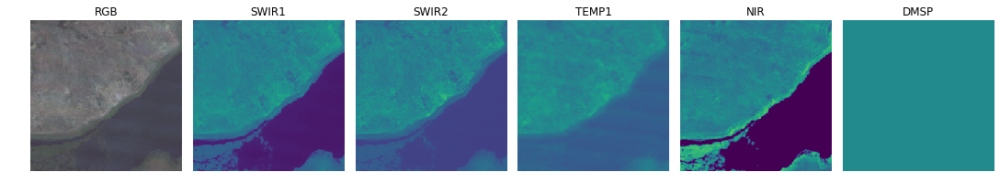

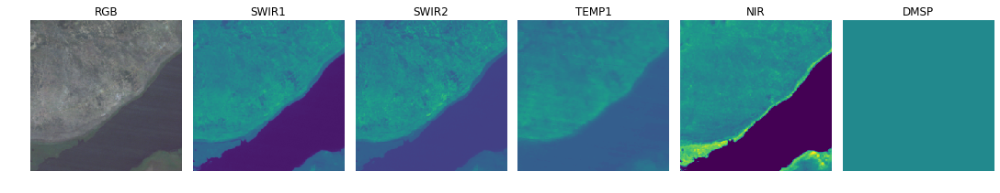

91-th largest (-) delta-of-index, 3-th index-of-delta
(2005 - 2009) delta-of-index=-0.430093, index-of-delta=-2.757002
loc = uganda (0.480720, 31.693167), 1 households


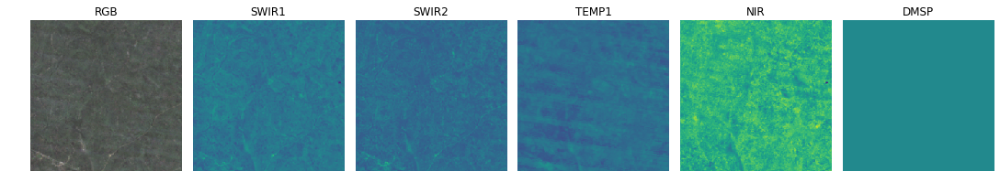

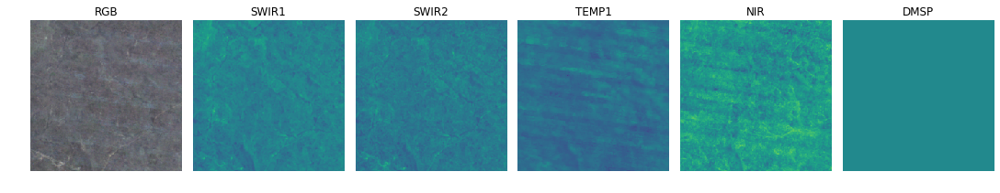

246-th largest (-) delta-of-index, 4-th index-of-delta
(2005 - 2009) delta-of-index=-0.211227, index-of-delta=-2.585721
loc = uganda (-0.439120, 31.711950), 1 households


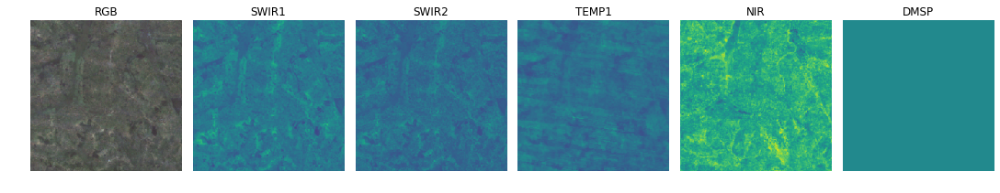

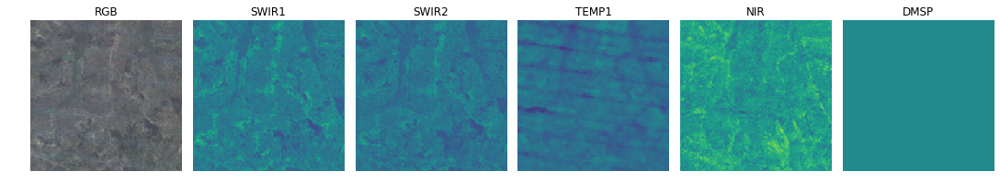

206-th largest (-) delta-of-index, 5-th index-of-delta
(2008 - 2012) delta-of-index=-0.239087, index-of-delta=-2.506919
loc = tanzania (-5.499930, 34.972881), 1 households


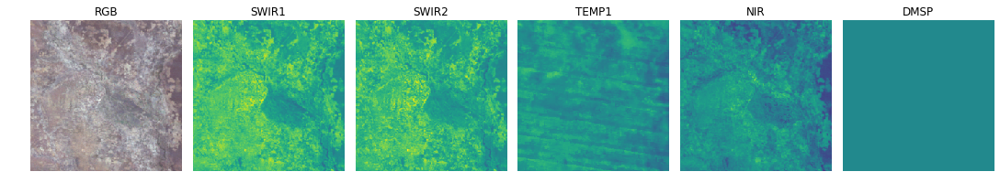

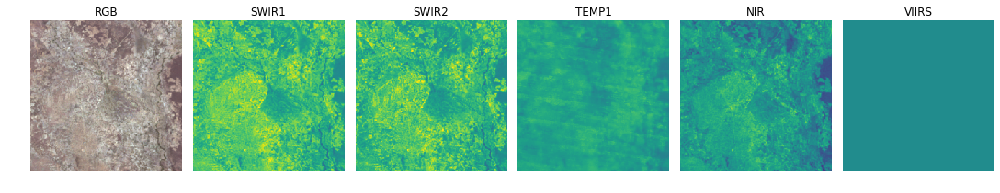

In [28]:
all_best, ranks_doi, ranks_iod = match_best(
    sorted_doi_indices_smallest, sorted_iod_indices_smallest, K=K)

paired_indices = df.loc[all_best, ['tfrecords_index.x', 'tfrecords_index.y']].values
images1 = get_images(tfrecord_paths[paired_indices[:, 0]])
images2 = get_images(tfrecord_paths[paired_indices[:, 1]])

plot_images_by_delta(
    images1, images2,
    order='largest (-)', ranks_doi=ranks_doi, ranks_iod=ranks_iod,
    df=df.loc[all_best])

## Smallest absolute delta

1-th smallest abs. delta-of-index, 211-th index-of-delta
(2009 - 2013) delta-of-index=0.000000, index-of-delta=-0.071393
loc = uganda (2.788371, 30.909168), 1 households


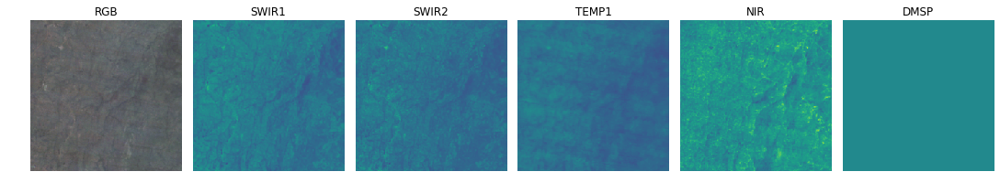

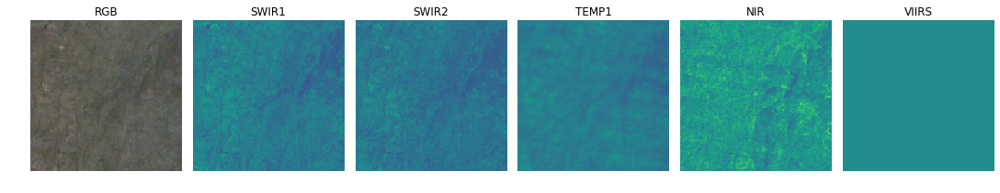

2-th smallest abs. delta-of-index, 209-th index-of-delta
(2008 - 2012) delta-of-index=0.000000, index-of-delta=-0.071393
loc = tanzania (-10.433400, 39.779629), 1 households


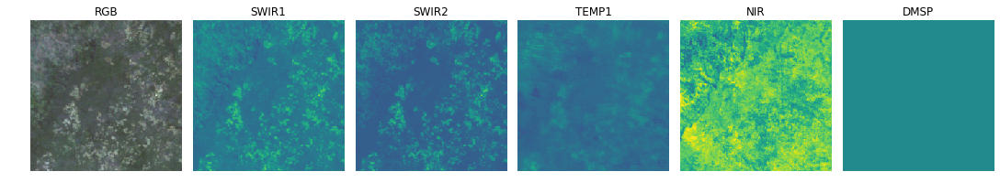

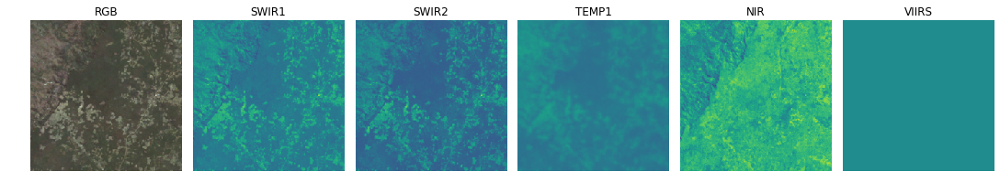

3-th smallest abs. delta-of-index, 208-th index-of-delta
(2009 - 2013) delta-of-index=0.000000, index-of-delta=-0.071393
loc = uganda (2.581154, 34.575676), 1 households


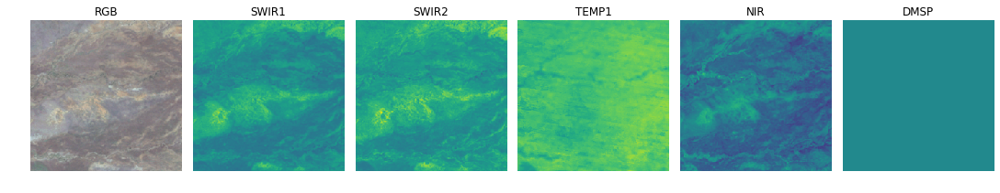

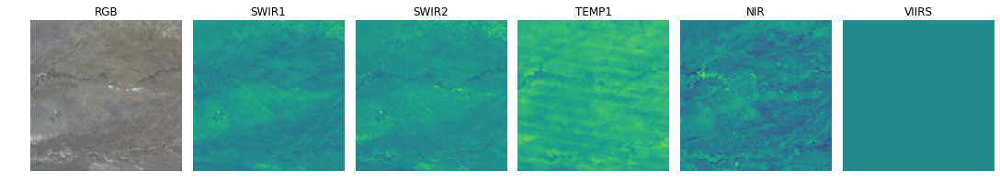

4-th smallest abs. delta-of-index, 207-th index-of-delta
(2005 - 2009) delta-of-index=0.000000, index-of-delta=-0.071393
loc = uganda (2.581154, 34.575676), 1 households


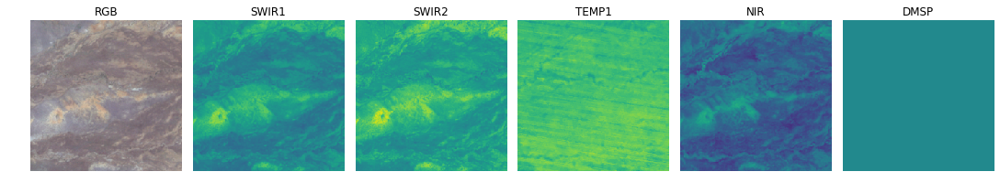

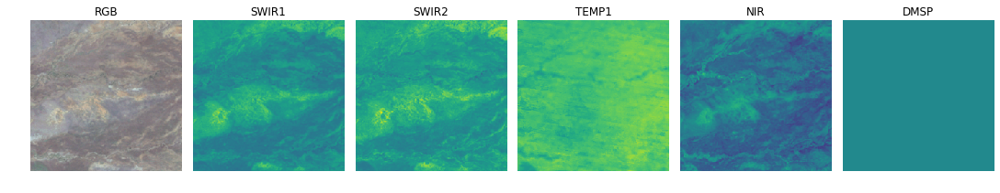

5-th smallest abs. delta-of-index, 210-th index-of-delta
(2011 - 2015) delta-of-index=0.000000, index-of-delta=-0.071393
loc = ethiopia (6.985894, 36.425520), 3 households


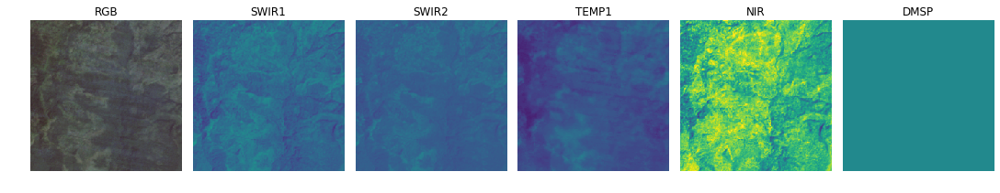

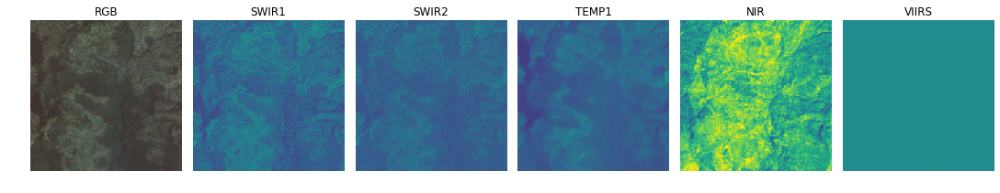

1102-th smallest abs. delta-of-index, 1-th index-of-delta
(2008 - 2012) delta-of-index=-0.339411, index-of-delta=-0.000164
loc = tanzania (-6.920360, 39.324501), 5 households


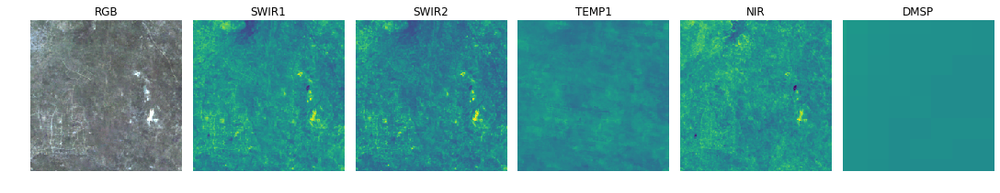

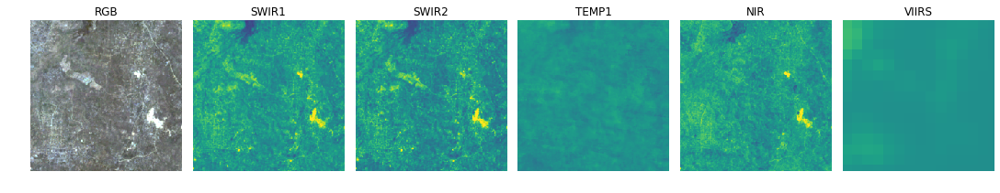

46-th smallest abs. delta-of-index, 2-th index-of-delta
(2010 - 2016) delta-of-index=0.005429, index-of-delta=-0.000775
loc = malawi (-11.536400, 34.278000), 12 households


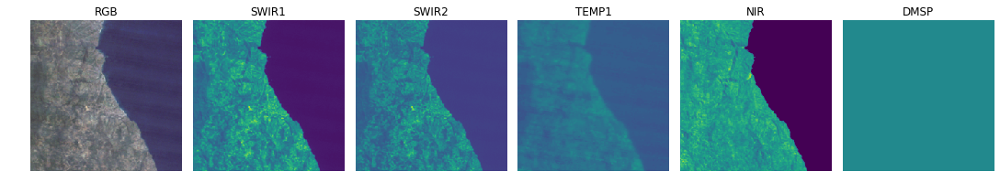

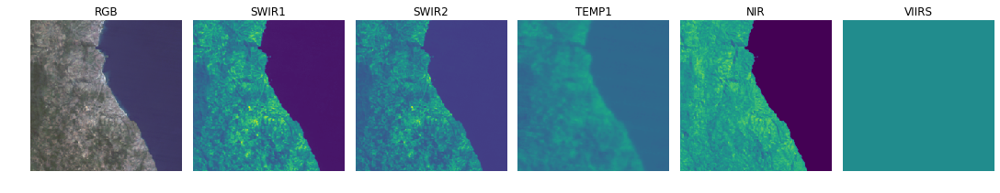

542-th smallest abs. delta-of-index, 3-th index-of-delta
(2011 - 2015) delta-of-index=0.127401, index-of-delta=0.001003
loc = ethiopia (9.239758, 42.441943), 5 households


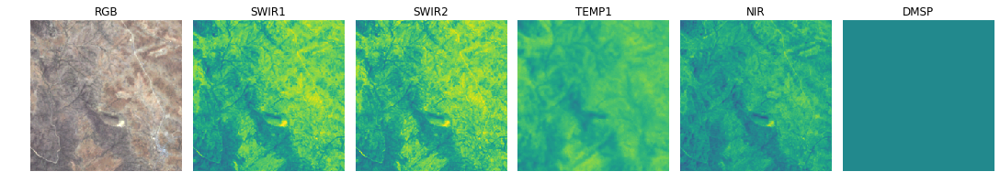

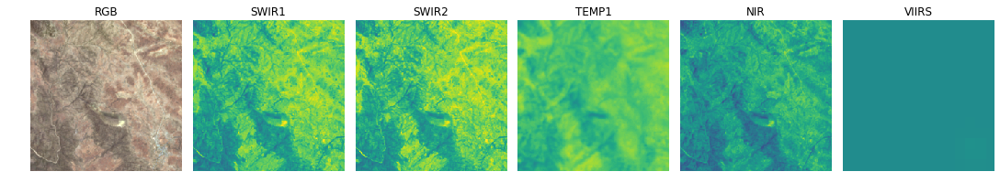

614-th smallest abs. delta-of-index, 4-th index-of-delta
(2011 - 2015) delta-of-index=0.145590, index-of-delta=0.001472
loc = ethiopia (10.955195, 38.284697), 10 households


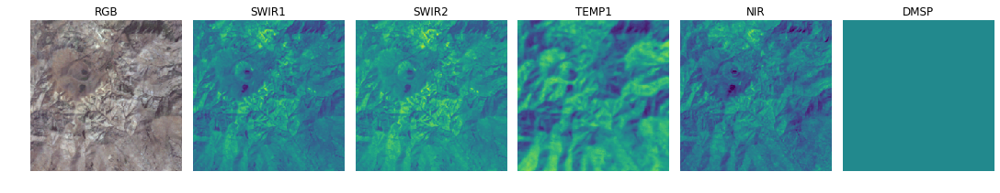

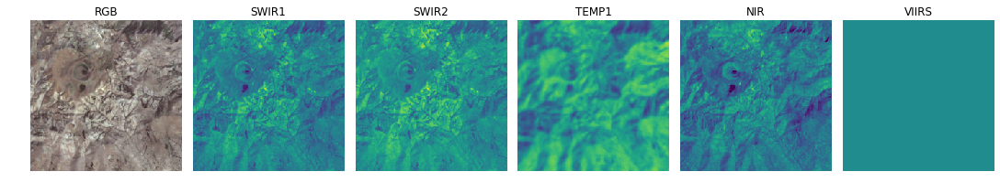

13-th smallest abs. delta-of-index, 5-th index-of-delta
(2009 - 2013) delta-of-index=-0.001279, index-of-delta=-0.001931
loc = uganda (0.378049, 32.594131), 1 households


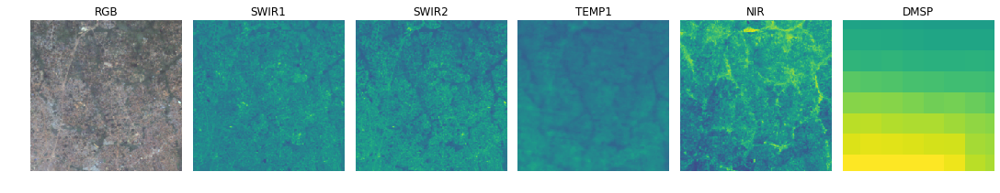

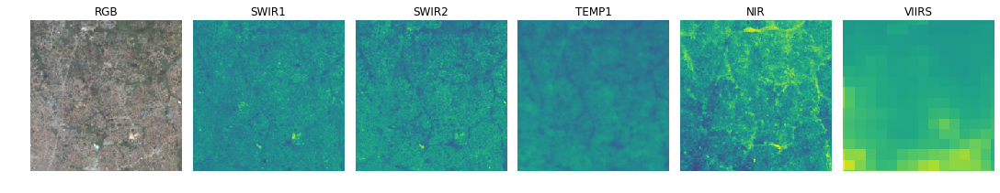

In [29]:
all_best, ranks_doi, ranks_iod = match_best(
    sorted_abs_doi_indices, sorted_abs_iod_indices, K=K)

paired_indices = df.loc[all_best, ['tfrecords_index.x', 'tfrecords_index.y']].values
images1 = get_images(tfrecord_paths[paired_indices[:, 0]])
images2 = get_images(tfrecord_paths[paired_indices[:, 1]])

plot_images_by_delta(
    images1, images2,
    order='smallest abs.', ranks_doi=ranks_doi, ranks_iod=ranks_iod,
    df=df.loc[all_best])